## Load Encoded Captions

In [1]:
import h5py
from os.path import join
import numpy as np
import random
import skimage
import skimage.io
import skimage.transform
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf

In [2]:
data_dir = 'Data'
h = h5py.File(join(data_dir, 'flower_tv.hdf5'))

In [3]:
flower_captions = {}
for ds in dict(h).items():
    flower_captions[ds[0]] = np.array(ds[1])

In [4]:
# each image has 5 captions each vectorized into 4800 vectors
flower_captions['image_05349.jpg']

array([[  1.12434858e-02,  -1.09033026e-02,  -5.40558062e-03, ...,
          4.71095368e-03,   3.07553913e-03,  -7.88170006e-03],
       [  5.23057580e-03,  -1.70876943e-02,  -5.15448023e-03, ...,
          1.07166674e-02,   1.85983779e-03,  -2.78546521e-03],
       [  2.36820132e-02,  -7.51516828e-03,  -5.73695637e-03, ...,
          6.86524883e-02,   1.42409978e-03,  -1.04672341e-02],
       [  3.76328523e-03,   2.30614142e-03,  -4.49462328e-03, ...,
         -1.71718730e-05,   2.64344364e-03,  -8.79086379e-04],
       [  1.11399777e-02,  -4.91742557e-03,  -8.57677124e-03, ...,
          6.91645890e-02,   1.77751575e-03,  -6.18656259e-03]], dtype=float32)

## How to create embedding with a new sentence

In [5]:
import imp
imp.load_source("skipthoughts", "./skip-thoughts/skipthoughts.py") 
import skipthoughts

model = skipthoughts.load_model()
#skipthoughts.load_tables()
encoder = skipthoughts.Encoder(model)


Loading model parameters...
Compiling encoders...
Loading tables...
Packing up...


In [6]:
imp.load_source("skipthoughts", "./skip-thoughts/skipthoughts.py") 
import skipthoughts
vectors = encoder.encode(["Hello World!", "how are you"],verbose=True)

3


In [7]:
vectors

array([[ 0.00289424, -0.01340304, -0.0031364 , ..., -0.00020494,
         0.00080485, -0.00859977],
       [ 0.00222143, -0.01256226, -0.01843037, ..., -0.00421009,
         0.01834102, -0.01412066]], dtype=float32)

## Prep Inputs For GAN

In [8]:
def load_training_data(data_dir, data_set='flowers'):
	if data_set == 'flowers':
		h = h5py.File(join(data_dir, 'flower_tv.hdf5'))
		flower_captions = {}
		for ds in h.items():
			flower_captions[ds[0]] = np.array(ds[1])
		image_list = [key for key in flower_captions]
		image_list.sort()

		img_75 = int(len(image_list)*1) # can be changed if don't need all pic
		training_image_list = image_list[0:img_75]
		#random.shuffle(training_image_list)
		
		return {
			'image_list' : training_image_list,
			'captions' : flower_captions,
			'data_length' : len(training_image_list)
		}

flower_cap = load_training_data(data_dir)

In [9]:
print (flower_cap['image_list'][0])
print (flower_cap['captions'][flower_cap['image_list'][0]])
print (flower_cap['data_length'])

image_00001.jpg
[[ 0.00247043 -0.00978464 -0.01372992 ..., -0.02817912  0.03375437
  -0.00589225]
 [ 0.01244221 -0.01928648 -0.00613386 ..., -0.0065219   0.00466952
  -0.01222099]
 [ 0.01298153 -0.00059234 -0.00383552 ...,  0.02389688  0.00137579
  -0.01621519]
 [ 0.00446556 -0.0084612  -0.00732049 ...,  0.00601037  0.00218833
   0.00555609]
 [ 0.01124559 -0.0070828  -0.0034986  ..., -0.02691613  0.0067353
  -0.00037385]]
8189


In [10]:
def load_image_array(image_file, image_size):
    img = skimage.io.imread(image_file)
    # GRAYSCALE
    if len(img.shape) == 2:
        img_new = np.ndarray( (img.shape[0], img.shape[1], 3), dtype = 'uint8')
        img_new[:,:,0] = img
        mg_new[:,:,1] = img
        img_new[:,:,2] = img
        img = img_new

    img_resized = skimage.transform.resize(img, (image_size, image_size))
    
    return img_resized.astype('float32')
    

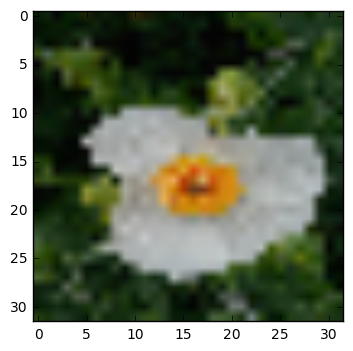

In [11]:

dir_img = join('Data/flowers/jpg', 'image_05306.jpg')
im = load_image_array(dir_img, 32)
plt.imshow(im)


In [12]:
#Compile training dataset: ID, Image (X), Embedding (Y)
img_id = flower_cap['image_list']
Y = np.zeros((flower_cap['data_length']*5,4800))
X= np.zeros((flower_cap['data_length'],32,32,3))
n=0

for i in img_id:
    for c in range(0,5):
        Y[(n*5+c),:] = flower_cap['captions'][i][c]
    X[n,:,:,:] = load_image_array(join('Data/flowers/jpg', i), 32)
    n += 1

In [13]:
print (X.shape)
print (Y.shape)

(8189, 32, 32, 3)
(40945, 4800)


## Conditional GAN

In [26]:
# Hyperparameters
mb_size = 128
num_epochs = 300
Z_dim = 3000
image_size = 32
image_channel = 3
label_size = len(flower_cap['captions'][flower_cap['image_list'][0]][0])  #4800 for skip-thought
D_learning_rate = 0.0001
G_learning_rate = 0.0001

# Helper Functions
def plot(samples):
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(6, 6)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(64, 64))

    return fig


def generate_a_graph(i,label_test): # generate image by label
    label_y = label_test[i].reshape(1, label_size)
    z = np.random.uniform(-1., 1., size=[1, Z_dim])
    g = sess.run(G_sample, feed_dict={Z_ph: z, Y_real:label_y})
    return (g.reshape(image_size, image_size,image_channel))

In [27]:
def sample_Z(m, n):
    '''Uniform prior for G(Z)'''
    return np.random.uniform(-1., 1., size=[m, n])

def batch_iter(data, label, batch_size, num_epochs, shuffle=True):
    """
    Generates a batch iterator for a dataset.
    """
    data = np.array(data)
    data_size = len(data)
    num_batches_per_epoch = int((len(data)-1)/batch_size) + 1
    for epoch in range(num_epochs):
        # Shuffle the data at each epoch
        if shuffle:
            shuffle_true_indices = np.random.permutation(np.arange(data_size))
            shuffle_false_indices = np.random.permutation(np.arange(data_size)) # need to check this
        for batch_num in range(num_batches_per_epoch):
            random_caption_index = random.randint(0,4) # random selection of one of the 5 caption each batch
            shuffle_true_label_index = [(x*5+random_caption_index) for x in shuffle_true_indices]
            shuffle_false_label_index = [(x*5+random_caption_index) for x in shuffle_false_indices]
            start_index = batch_num * batch_size
            end_index = min((batch_num + 1) * batch_size, data_size)
            image_true =  data[shuffle_true_indices[start_index:end_index]]
            #image_false = data[shuffle_false_indices[start_index:end_index]]
            label_true = label[shuffle_true_label_index[start_index:end_index]]
            label_false = label[shuffle_false_label_index[start_index:end_index]]
            yield (image_true, label_true, label_false)

In [28]:
# Construct the conditional GAN

tf.reset_default_graph()

def xavier_init(size):
    return tf.random_normal(shape=size, stddev=(1. / tf.sqrt(size[0] / 2.)))

def generator(z, y):
    z_y = tf.concat([z, y], 1) # z_dim+4800
    # G_h1 = tf.nn.relu(tf.matmul(z_y, G_W1) + G_b1)
    #G_log_prob = tf.matmul(G_h1, G_W2) + G_b2
    #G_prob = tf.nn.sigmoid(G_log_prob)
    G_h1 = tf.layers.dense(inputs=z_y, 
                           units=8*8*3, 
                           kernel_initializer = tf.contrib.layers.xavier_initializer(),
                           bias_initializer = tf.contrib.layers.xavier_initializer(),
                           #activation=tf.nn.relu, 
                           name='G_dense')
    G_h1_norm = tf.layers.batch_normalization(inputs=G_h1, name='G_norm1')
    G_h1_relu = tf.nn.relu(G_h1_norm)
    
    G_h2 = tf.reshape(G_h1_relu, [-1, 8, 8, 3])
    G_deconv_1 = tf.layers.conv2d_transpose(G_h2, 3, 5, 
                                            strides=2, 
                                            padding="same", 
                                            kernel_initializer = tf.contrib.layers.xavier_initializer(),
                                            bias_initializer = tf.contrib.layers.xavier_initializer(),
                                            #activation=tf.nn.relu, 
                                            name='G_deconv_1')
    G_deconv_1_norm = tf.layers.batch_normalization(inputs=G_deconv_1, name='G_norm2')
    G_deconv_1_relu = tf.nn.relu(G_deconv_1_norm)
    
    G_deconv_2 = tf.layers.conv2d_transpose(G_deconv_1_relu, 3, 5, 
                                            strides=2, 
                                            padding="same", 
                                            kernel_initializer = tf.contrib.layers.xavier_initializer(),
                                            bias_initializer = tf.contrib.layers.xavier_initializer(),
                                            #activation=tf.nn.relu, 
                                            name='G_deconv_2')
    G_deconv_2_norm = tf.layers.batch_normalization(inputs=G_deconv_2, name='G_norm3')
    return tf.tanh(G_deconv_2_norm)

def discriminator(x, y, reuse=False):
    #x_y = tf.concat([x, y], 1) #32*32*3+4800<-40*40*3
    #D_h1 = tf.nn.relu(tf.matmul(tf.contrib.layers.flatten(x_y), D_W1) + D_b1)
    #D_logit = tf.matmul(D_h1, D_W2) + D_b2
    #D_prob = tf.nn.sigmoid(D_logit)
    
    with tf.variable_scope("discriminator", reuse=reuse):

        image_input = tf.reshape(x, [-1, image_size, image_size, image_channel])

        D_conv_1 = tf.layers.conv2d(
            inputs=image_input,
            filters=64,
            kernel_size=[3, 3],
            kernel_initializer = tf.contrib.layers.xavier_initializer(),
            bias_initializer = tf.contrib.layers.xavier_initializer(),
            padding="same",
            name='D_conv_1')
        D_pool_1 = tf.layers.max_pooling2d(inputs=D_conv_1, pool_size=[2, 2], strides=2)
        D_norm_1 = tf.layers.batch_normalization(inputs=D_pool_1, name='D_norm1')
        D_relu_1 = tf.nn.leaky_relu(D_norm_1, alpha=0.2, name='D_relu_1')

        D_conv_2 = tf.layers.conv2d(
            inputs=D_relu_1,
            filters=128,
            kernel_size=[3, 3],
            kernel_initializer = tf.contrib.layers.xavier_initializer(),
            bias_initializer = tf.contrib.layers.xavier_initializer(),
            padding="same",
            name='D_conv_2')
        D_pool_2 = tf.layers.max_pooling2d(inputs=D_conv_2, pool_size=[2, 2], strides=2)
        D_norm_2 = tf.layers.batch_normalization(inputs=D_pool_2, name='D_norm2')
        D_relu_2 = tf.nn.leaky_relu(D_norm_2, alpha=0.2, name='D_relu_2')

        pool2_flat = tf.reshape(D_relu_2, [-1, int(image_size/4) * int(image_size/4) * 128])
        
        dense_input = tf.concat([pool2_flat,y], 1)

        D_h1 = tf.layers.dense(inputs=dense_input, 
                                units=128, 
                                kernel_initializer = tf.contrib.layers.xavier_initializer(),
                                bias_initializer = tf.contrib.layers.xavier_initializer(),
                                activation=tf.nn.leaky_relu, 
                                name='D_dense_1')
        D_logit = tf.layers.dense(inputs=D_h1, 
                                    units=1, 
                                    kernel_initializer = tf.contrib.layers.xavier_initializer(),
                                    bias_initializer = tf.contrib.layers.xavier_initializer(),
                                    activation=tf.nn.leaky_relu, 
                                    name='D_dense_2')
        D_prob = tf.nn.sigmoid(D_logit)

        return D_prob, D_logit


# Discriminator Net
X_ph = tf.placeholder(tf.float32, shape=[None, (image_size*image_size*3)], name='X')
Y_real = tf.placeholder(tf.float32, shape=[None, label_size], name='Y_real')
Y_fake = tf.placeholder(tf.float32, shape=[None, label_size], name='Y_fake')

#D_W1 = tf.Variable(xavier_init([(image_size*image_size*3+label_size), 128]), name='D_W1')
#D_b1 = tf.Variable(tf.zeros(shape=[128]), name='D_b1')

#D_W2 = tf.Variable(xavier_init([128, 1]), name='D_W2')
#D_b2 = tf.Variable(tf.zeros(shape=[1]), name='D_b2')

#theta_D = [D_W1, D_W2, D_b1, D_b2]


# Generator Net
Z_ph = tf.placeholder(tf.float32, shape=[None, Z_dim], name='Z')

#G_W1 = tf.Variable(xavier_init([Z_dim+label_size, 128]), name='G_W1')
#G_b1 = tf.Variable(tf.zeros(shape=[128]), name='G_b1')

#G_W2 = tf.Variable(xavier_init([128, (image_size*image_size*3) ]), name='G_W2')
#G_b2 = tf.Variable(tf.zeros(shape=[(image_size*image_size*3)]), name='G_b2')

#theta_G = [G_W1, G_W2, G_b1, G_b2]

# losses and MaxMin
G_sample = generator(Z_ph, Y_real)

D_real, D_logit_real = discriminator(X_ph, Y_real)
#tf.get_variable_scope().reuse_variables()
D_fake, D_logit_fake = discriminator(G_sample,Y_real, reuse=True)
D_real_fake, D_logit_real_fake = discriminator(X_ph, Y_fake, reuse=True)

D_loss = -tf.reduce_mean(tf.log(D_real) + (tf.log(1. - D_fake) + tf.log(1. - D_real_fake))/2)
G_loss = -tf.reduce_mean(tf.log(D_fake))

# Trainable W and b as variable list
t_vars = tf.trainable_variables()
    
theta_D = [var for var in t_vars if 'D_' in var.name]
theta_G = [var for var in t_vars if 'G_' in var.name]

#for var in theta_G:
#    print(var.name)


# Only update D(X)'s parameters, so var_list = theta_D
D_solver = tf.train.AdamOptimizer(D_learning_rate,beta1=0.5).minimize(D_loss, var_list=theta_D)
# Only update G(X)'s parameters, so var_list = theta_G
G_solver = tf.train.AdamOptimizer(G_learning_rate,beta1=0.5).minimize(G_loss, var_list=theta_G)



Iter: 1
D loss: 1.398
G_loss: 0.5541
epoch:  1



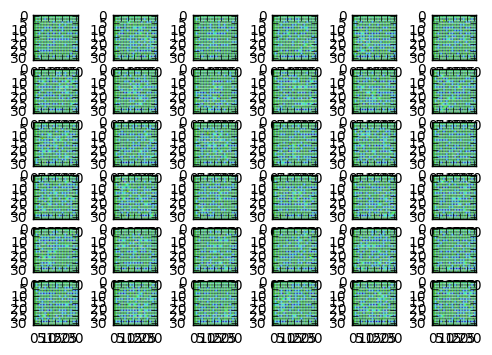

Iter: 500
D loss: 0.9996
G_loss: 2.899
epoch:  504



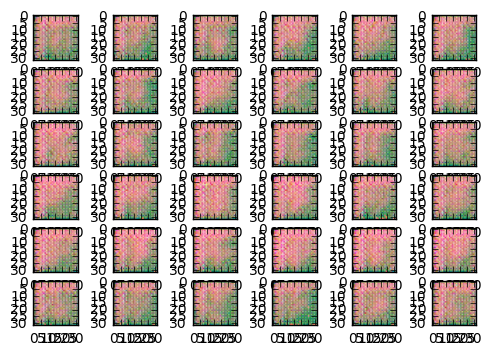

Iter: 1000
D loss: 1.036
G_loss: 2.701
epoch:  505



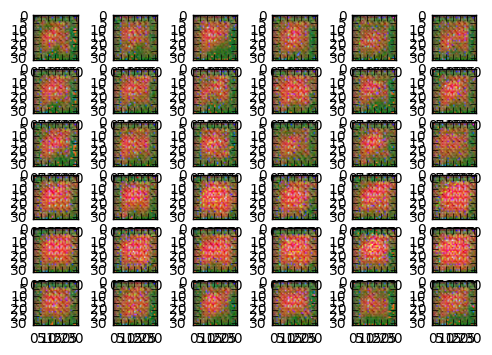

Iter: 1500
D loss: 1.021
G_loss: 2.386
epoch:  505



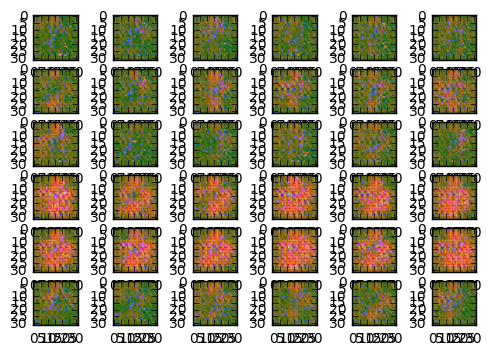

Iter: 2000
D loss: 1.024
G_loss: 3.514
epoch:  505



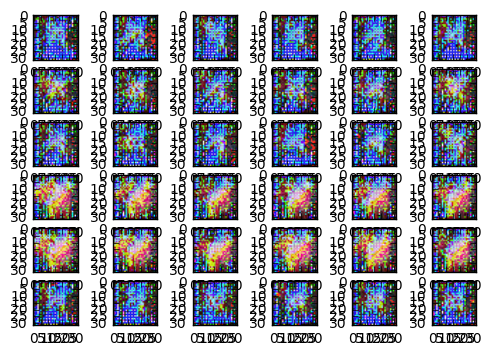

Iter: 2500
D loss: 1.015
G_loss: 2.581
epoch:  505



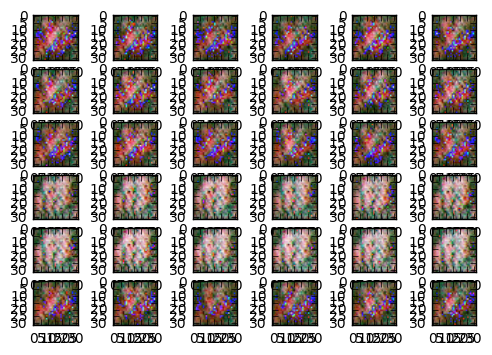

Iter: 3000
D loss: 0.9983
G_loss: 2.854
epoch:  505



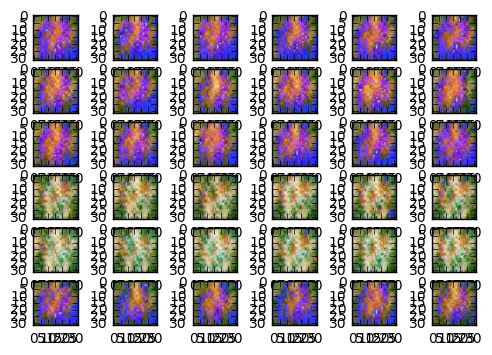

Iter: 3500
D loss: 1.036
G_loss: 2.594
epoch:  505



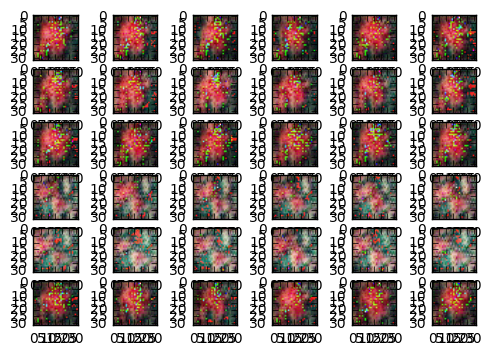

Iter: 4000
D loss: 1.012
G_loss: 2.738
epoch:  505



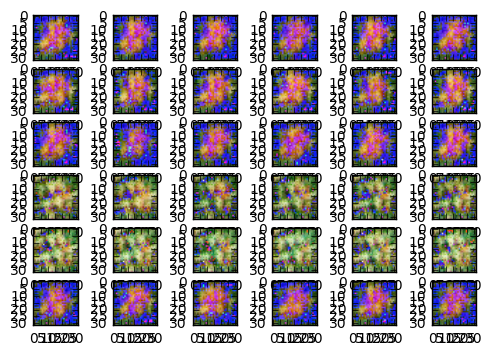

Iter: 4500
D loss: 1.008
G_loss: 2.792
epoch:  505



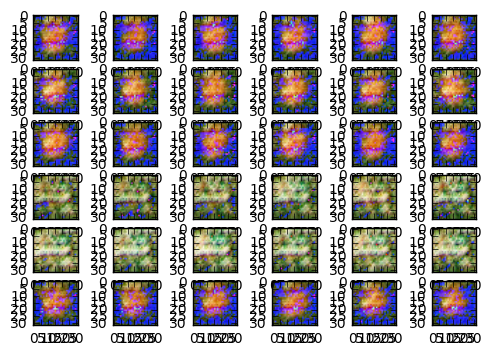

Iter: 5000
D loss: 1.039
G_loss: 3.024
epoch:  505



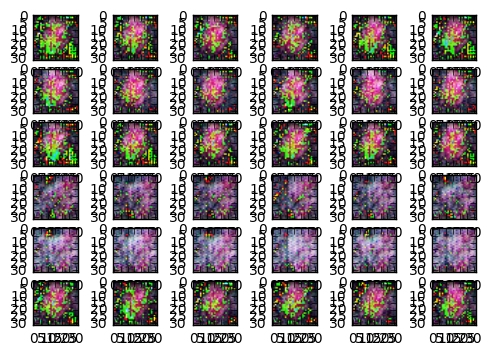

Iter: 5500
D loss: 1.005
G_loss: 3.539
epoch:  505



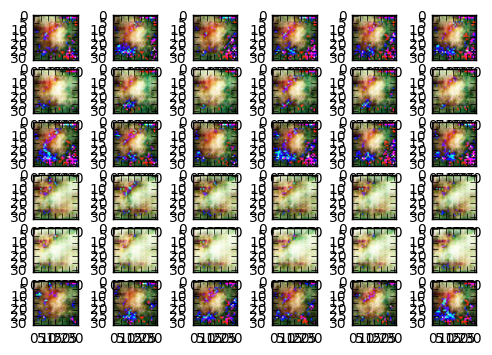

Iter: 6000
D loss: 0.9878
G_loss: 3.625
epoch:  505



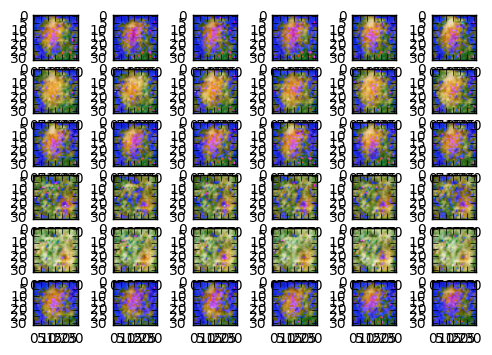

Iter: 6500
D loss: 0.9943
G_loss: 3.311
epoch:  505



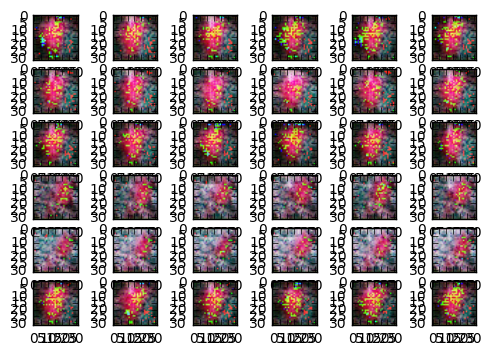

Iter: 7000
D loss: 0.9746
G_loss: 5.268
epoch:  505



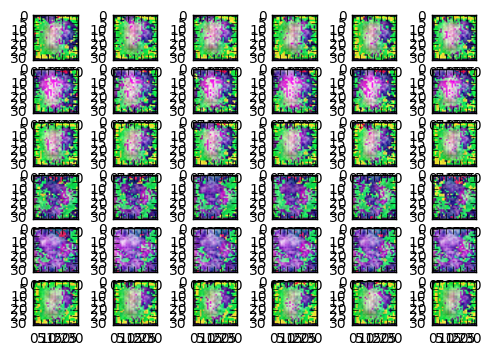

Iter: 7500
D loss: 0.9844
G_loss: 3.28
epoch:  505



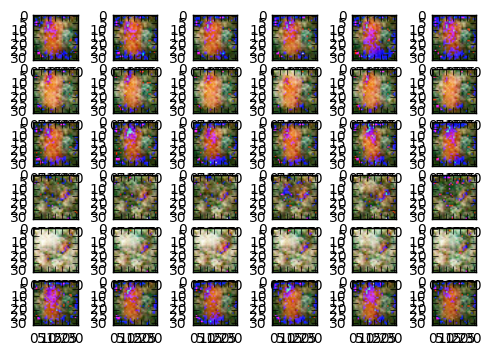

Iter: 8000
D loss: 0.9791
G_loss: 3.752
epoch:  505



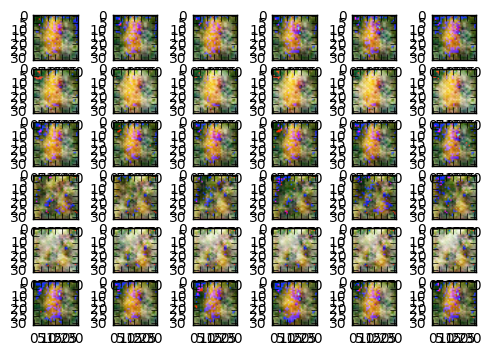

Iter: 8500
D loss: 0.9768
G_loss: 3.669
epoch:  505



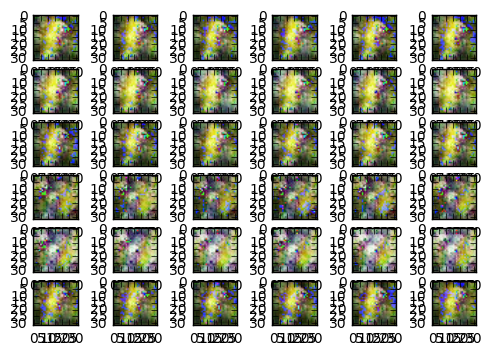

Iter: 9000
D loss: 0.989
G_loss: 2.423
epoch:  505



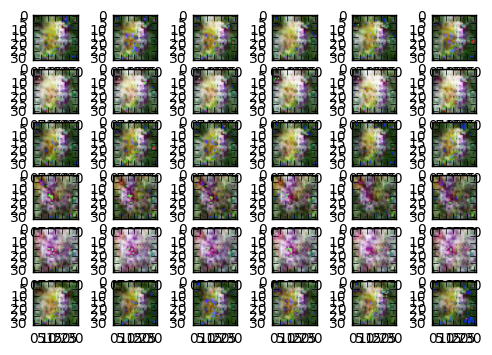

Iter: 9500
D loss: 0.9585
G_loss: 3.135
epoch:  505



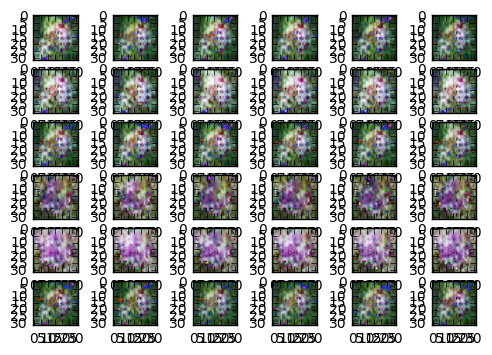

Iter: 10000
D loss: 0.9675
G_loss: 3.016
epoch:  505



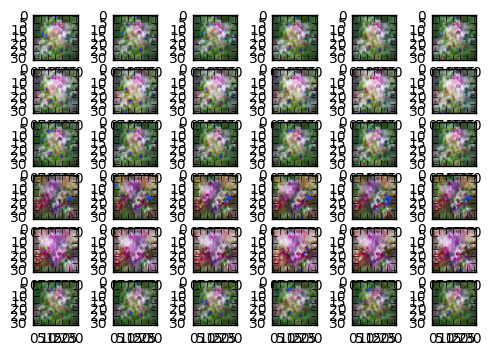

Iter: 10500
D loss: 0.9494
G_loss: 3.248
epoch:  505



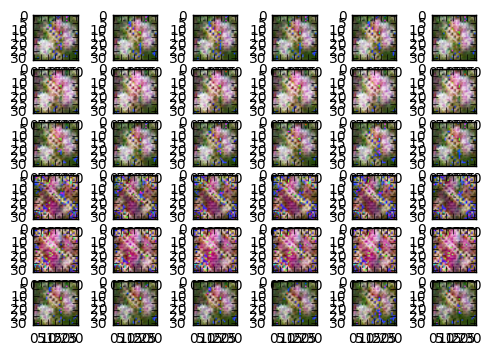

Iter: 11000
D loss: 1.015
G_loss: 3.8
epoch:  505



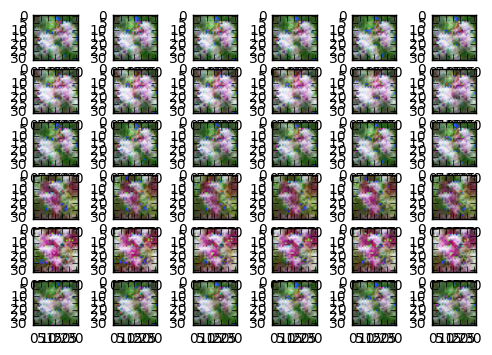

Iter: 11500
D loss: 0.9368
G_loss: 3.301
epoch:  505



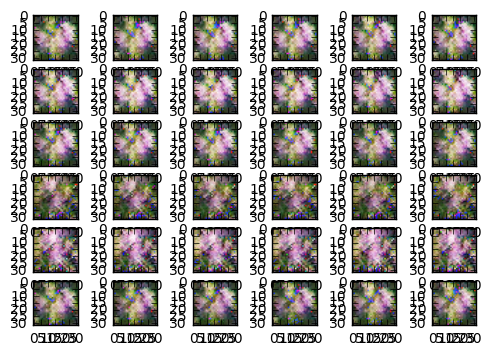

Iter: 12000
D loss: 0.9173
G_loss: 3.397
epoch:  505



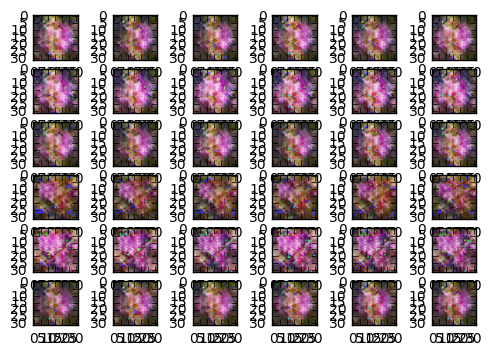

Iter: 12500
D loss: 0.9661
G_loss: 4.196
epoch:  505



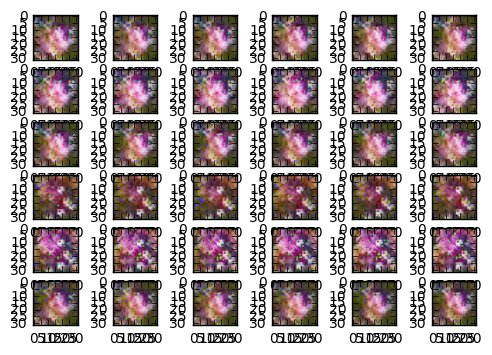

Iter: 13000
D loss: 0.9366
G_loss: 3.009
epoch:  505



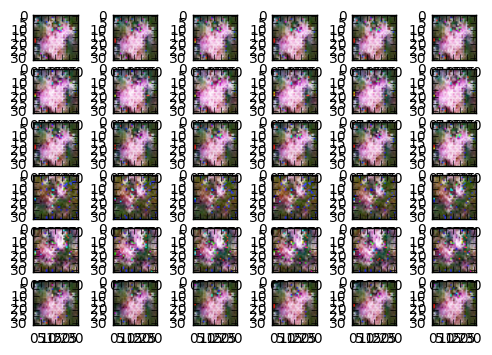

Iter: 13500
D loss: 0.9222
G_loss: 3.209
epoch:  505



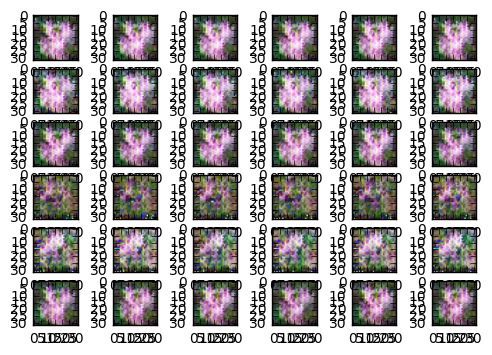

Iter: 14000
D loss: 0.9096
G_loss: 3.644
epoch:  505



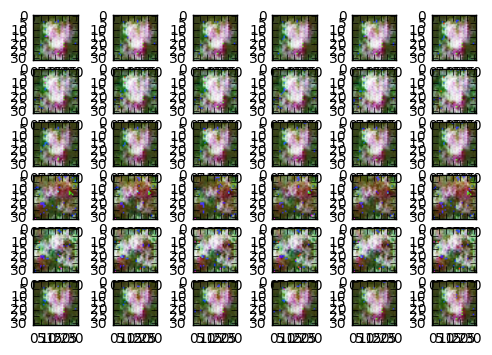

Iter: 14500
D loss: 0.9029
G_loss: 4.798
epoch:  505



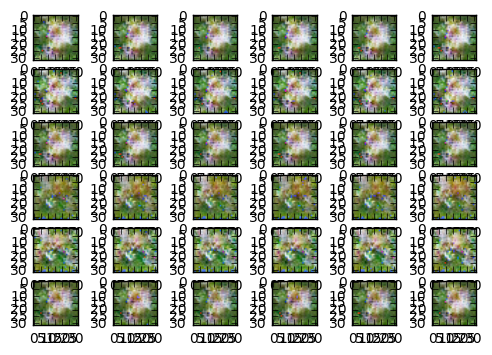

Iter: 15000
D loss: 0.903
G_loss: 3.91
epoch:  505



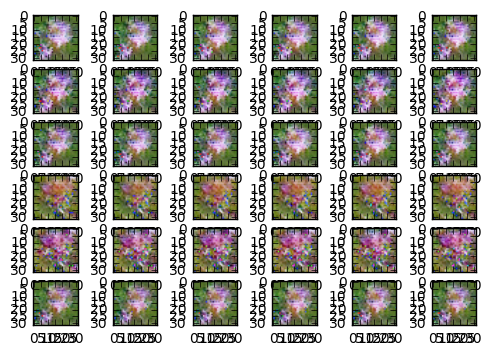

Iter: 15500
D loss: 0.8755
G_loss: 3.622
epoch:  505



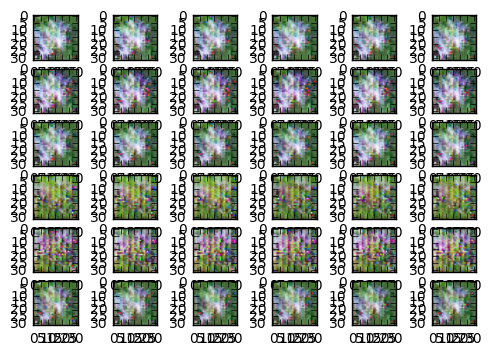

Iter: 16000
D loss: 0.8994
G_loss: 4.731
epoch:  505



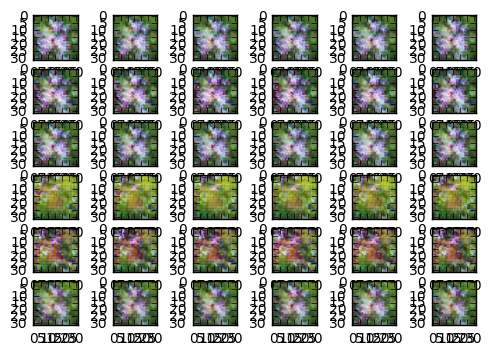

Iter: 16500
D loss: 0.8798
G_loss: 3.71
epoch:  505



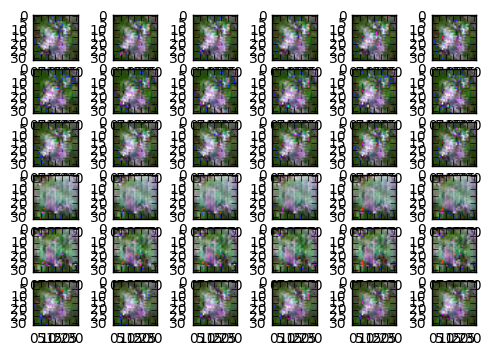

Iter: 17000
D loss: 0.9319
G_loss: 3.461
epoch:  505



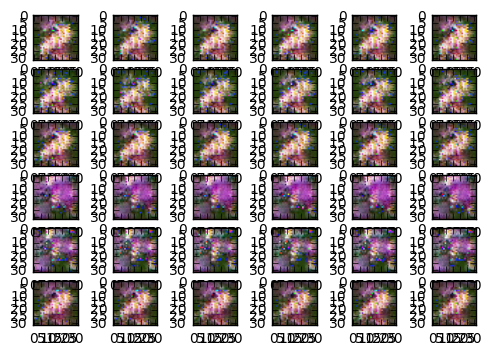

Iter: 17500
D loss: 0.8802
G_loss: 3.64
epoch:  505



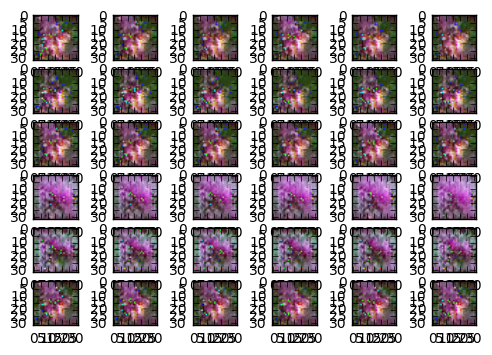

Iter: 18000
D loss: 0.8615
G_loss: 3.697
epoch:  505



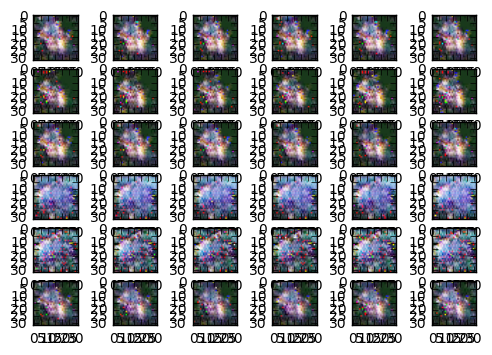

Iter: 18500
D loss: 0.8478
G_loss: 4.154
epoch:  505



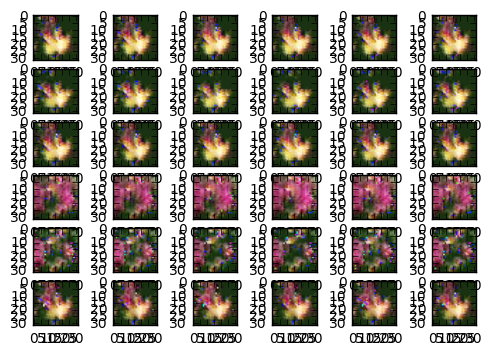

Iter: 19000
D loss: 0.8916
G_loss: 3.629
epoch:  505



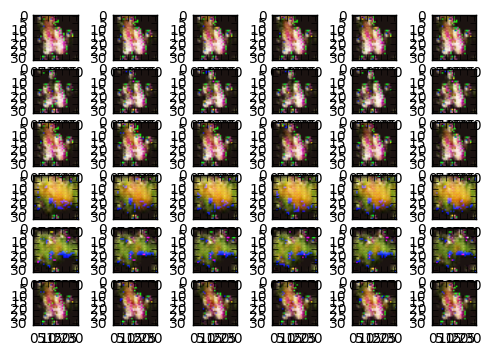

In [29]:
## Run the conditional GAN model

# define global steps 
global_step = tf.Variable(0, name="global_step", trainable=False)
incr_global_step_op = tf.assign(global_step, global_step+1)

# define test label 
caption = [
    'the flower shown has yellow anther red pistil and bright red petals',
    'this flower has petals that are yellow, white and purple and has dark lines',
    'the petals on this flower are white with a yellow center',
    'this flower has a lot of small round pink petals.',
    'this flower is orange in color, and has petals that are ruffled and rounded.',
    'the flower has yellow petals and the center of it is brown']
label_test = encoder.encode(caption,verbose=False)


# start tf session
#sess = tf.Session(config=tf.ConfigProto(log_device_placement=True, device_count = {'GPU': 0}))
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
sess.run(tf.global_variables_initializer())

# initialize loss
D_loss_c = []
G_loss_c = []

# Run in mini batch
batches = batch_iter(X, Y, mb_size, num_epochs)
n = 1
for image_true, label_true, label_false in batches:

    _, D_loss_curr, _, G_loss_curr, i = sess.run([D_solver, D_loss, G_solver, G_loss, incr_global_step_op]
                                                 ,feed_dict={X_ph: image_true.reshape([-1,(image_size*image_size*3)])
                                                             , Y_real: label_true
                                                             , Y_fake: label_false
                                                             , Z_ph:sample_Z(image_true.shape[0], Z_dim)
                                                             })
    # print some loss during the training
    if i % 500 == 0 or i==1:
        print('Iter: {}'.format(i))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print('epoch: ', n)
        print()
        D_loss_c.append(D_loss_curr)
        G_loss_c.append(G_loss_curr)
        
    # generate plot with set label during the training    
    if i % 500 == 0 or i==1:
        f, axarr = plt.subplots(6,6)
        for n in range(6):
            for m in range(6):
                im = generate_a_graph(n,label_test)
                axarr[n,m].imshow(im)
        plt.show()
    n+=1

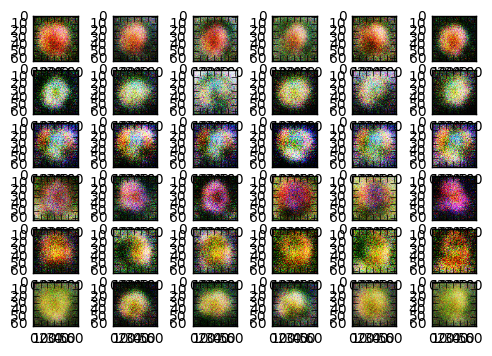

In [35]:
if i % 1000 == 0 or i==1:
    f, axarr = plt.subplots(6,6)
    for n in range(6):
        for m in range(6):
            im = generate_a_graph(n,label_test)
            axarr[n,m].imshow(im)
    plt.show()